# Group 2: Phase 4 - Cats and Dogs Image Detection (CaDoD)

### Authors: Owen Collier, Julia Donato, Jacob Scott, Gregory Shoda
### Email Addresses: owcoll@iu.edu, judonato@iu.edu, scotjaco@iu.edu, gshoda@iu.edu

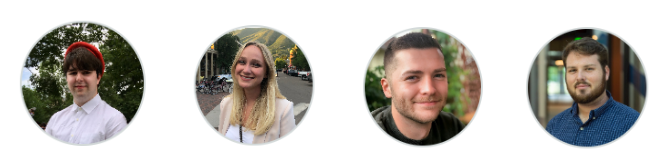

## Phase Leadership Plan
|              | Phase 1       | Phase 2     | Phase 3       | Phase 4       |
|--------------|---------------|-------------|---------------|---------------|
|  |  Group Effort | Jacob Scott | Owen Collier/Julia Donato | Gregory Shoda |


## Phase 4 Credit Assignment Plan
| Item Phase | Item Name                                                                                   | Assignee | Due | SMART Goal |
|------------|----------------------------------------------------------------------------------------------|----------|-----|------------|
| 4          | A cleaned-up and complete version of your homegrown multi-task (BCE+MSE + Regularization) model using Python and Numpy                  |  Jacob        |12/04/2023     | Jacob will report all experiments in terms of intersection over union (IOU) for object detection           |
| 4          | Transform the cats and dogs training data (primarily the annotations data) so that EfficientDet can use them | Julia         |12/04/2023     | Julia will transfomr the cats and dogs training data so that EfficientDet can use them |
| 4          | Summarize the architecture and loss functions of EfficientDet                                |Julia|12/04/2023|Julia will summarize the architecture and loss functions of EfficientDet|
| 4          | Highlight the differences between EfficientDet D0 and EfficientDet D7                        |Julia|12/04/2023|Julia will explain the differences between EfficientDet D0 and EfficientDet d&|
| 4          | Do experiments on YoloV8   |     Greg     |12/04/2023|Greg will perform experiments on YoloV8.|
| 4          | Build a fully convolutional neural network (FCN) for a single object classifier and detector.|  Owen        |12/04/2023|Owen will build a convolutional neural network for a single object classifier and detector which will be applied to the cats and dogs data |
| 4          | Report and short video presentation (2-minute video presentation; 300 words)                 |  All|12/05/2023     |We as a group will creat a 2 minute video presentation (around 300 words) to present our project|


## Phase 4 Gantt Chart

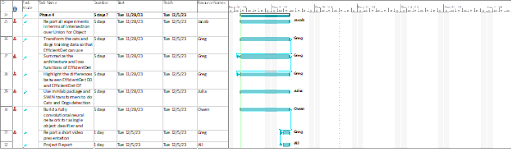

## Abstract

This project targets improved object detection, initially developing a multi-task model combining Binary Cross-Entropy (BCE), Mean Squared Error (MSE), and regularization. Phase 4 advances this by refining the model and incorporating Intersection over Union (IoU) for enhanced detection accuracy. A significant addition is the use of EfficientDet (D0-D7) for cats and dogs detection, involving annotation data transformation and network head fine-tuning. We compare EfficientDet D0 and D7 to illustrate architecture and loss function differences. Additionally, experiments with YoloV8 and a fully convolutional neural network (FCN) for single-object detection are conducted. Real-time training results are visualized using Tensorboard. The project demonstrates notable progress in object detection, as reflected by [results].

## Introduction

The CaDOd Project is an ambitious initiative focused on advancing the field of computer vision, specifically in object detection. The project's primary goal is to develop cutting-edge models capable of accurately identifying and localizing cats and dogs within images, leveraging the latest advancements in deep learning techniques. This project is meticulously structured into four progressive phases, each designed to build upon the last, culminating in a comprehensive and sophisticated object detection system.

**Phase 1: Project Proposal**
The initial phase involves crafting a detailed project proposal. This foundational step outlines crucial aspects such as data selection, evaluation metrics, baseline models, and the development of pipelines. It also establishes a clear plan for credit assignment among contributors.

**Phase 2: EDA and Baseline Pipeline**
In this phase, the team undertakes Exploratory Data Analysis (EDA) to gain insights into the dataset and establish baseline models using SKLearn. A specific SKLearn pipeline is developed for cat and dog detection, incorporating elements like feature engineering and hyperparameter tuning. Additionally, this phase explores the creation of homegrown linear and logistic regression models for multi-target prediction and complex multi-task loss functions.

**Phase 3: HomeGrown and PyTorch Deep Learning**
This phase sees the implementation of homegrown models equipped with extended loss functions. Concurrently, PyTorch pipelines are constructed, utilizing Multi-Layer Perceptrons (MLPs) for classification and regression tasks, and a multi-headed cat-dog detector. A stretch goal for this phase is the development of a convolutional neural network to enhance detection capabilities further.


**Phase 4: Enhanced Object Detection and Model Refinement**
Phase 4 focuses on refining our multi-task model, incorporating advanced features like optimized loss functions and Intersection over Union (IoU) metrics for object detection accuracy. We employ transfer learning with EfficientDet (D0-D7) for improved cats and dogs detection, alongside experiments with YoloV8 and the development of a Fully Convolutional Neural Network (FCN) for single-object detection. This phase also involves using Tensorboard for real-time training visualization, significantly enhancing our object detection methodologies.

Overall, the CaDOd Project represents a comprehensive and multi-faceted approach to object detection in computer vision, poised to contribute significantly to the field through its innovative methodologies and advanced technological applications.

### Data Description
The image archive `cadod.tar.gz` is a subset [Open Images V6](https://storage.googleapis.com/openimages/web/download.html). It contains a total of 12,966 images of dogs and cats.


Image bounding boxes are stored in the csv file `cadod.csv`. The following describes whats contained inside the csv.

* ImageID: the image this box lives in.
* Source: indicates how the box was made:
    * xclick are manually drawn boxes using the method presented in [1], were the annotators click on the four extreme points of the object. In V6 we release the actual 4 extreme points for all xclick boxes in train (13M), see below.
    * activemil are boxes produced using an enhanced version of the method [2]. These are human verified to be accurate at IoU>0.7.
* LabelName: the MID of the object class this box belongs to.
* Confidence: a dummy value, always 1.
* XMin, XMax, YMin, YMax: coordinates of the box, in normalized image coordinates. XMin is in [0,1], where 0 is the leftmost pixel, and 1 is the rightmost pixel in the image. Y coordinates go from the top pixel (0) to the bottom pixel (1).
* XClick1X, XClick2X, XClick3X, XClick4X, XClick1Y, XClick2Y, XClick3Y, XClick4Y: normalized image coordinates (as XMin, etc.) of the four extreme points of the object that produced the box using [1] in the case of xclick boxes. Dummy values of -1 in the case of activemil boxes.

The attributes have the following definitions:

* IsOccluded: Indicates that the object is occluded by another object in the image.
* IsTruncated: Indicates that the object extends beyond the boundary of the image.
* IsGroupOf: Indicates that the box spans a group of objects (e.g., a bed of flowers or a crowd of people). We asked annotators to use this tag for cases with more than 5 instances which are heavily occluding each other and are physically touching.
* IsDepiction: Indicates that the object is a depiction (e.g., a cartoon or drawing of the object, not a real physical instance).
* IsInside: Indicates a picture taken from the inside of the object (e.g., a car interior or inside of a building).
For each of them, value 1 indicates present, 0 not present, and -1 unknown.

### Data Lineage
**Instructions for this section**
In this final report, we don't need an expansive EDA from a previous phase where you are actually exploring the data. But we do need a Data Lineage that includes the data origin and the transformations (think joins, think features). Data lineage gives visibility while greatly simplifying the ability to trace errors back to the root cause in a success failure analysis.

1. **Source of Data:**
    - The image data is sourced from a `.tar.gz` file directly from Open Images, specifically named `cadod.tar.gz`. This file contains the images that are used for subsequent processing.
2. **Data Extraction:**
    - The images are extracted from the `cadod.tar.gz` file using a custom function `extract_tar`. This function handles the extraction process and ensures that files are only extracted if they do not already exist in the target directory.
3. **Data Transformation:**
    - Post-extraction, each image undergoes a resizing process where it is converted to a uniform size of 128x128 pixels.
    - The resized images are then converted into NumPy arrays and flattened. This transformation is crucial for preparing the image data for machine learning tasks, as it converts the image into a format (a one-dimensional array) that can be easily processed by ML models.
4. **Pickling:**
    - The data was pickled for later use in models as `.npy` files. Data was then imported, split, and used for training models on a per-model basis. Feature scaling/engineering was also done this way.

### Work Flow
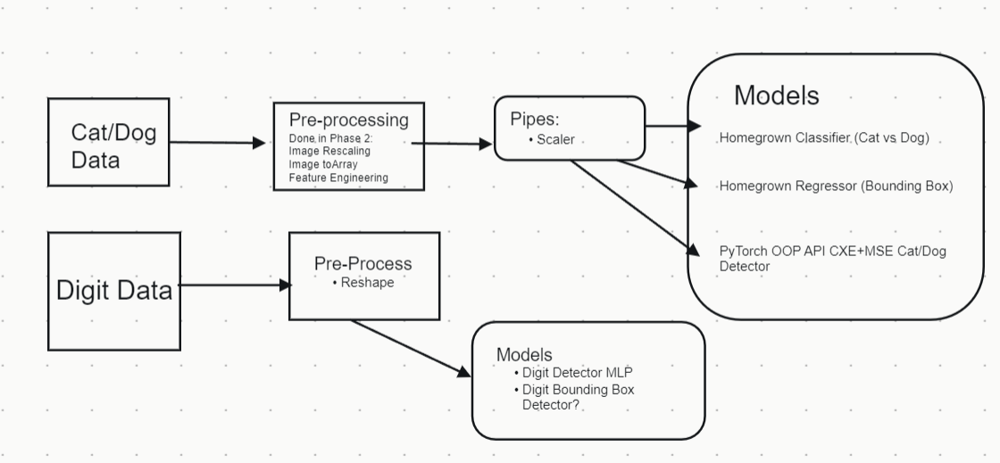



```
# This is formatted as code
```

## Methods

### Scikit-Learn

**Image Classification with SGDClassifier:**

- **Data Loading and Preprocessing:** We loaded image data from a Numpy array, `X`, and split it into training, validation, and test sets. The dataset was stratified to maintain the same proportion of classes in each split.
- **Model Selection and Configuration:** We chose the `SGDClassifier` with a logistic loss function (`loss='log'`) for its efficiency in handling large datasets and its capability for stochastic gradient descent. This choice also allowed us to leverage early stopping to prevent overfitting.
- **Training:** The classifier was trained with the `adaptive` learning rate and a very small initial eta (`eta0=1e-10`). The model was configured to stop training if no improvement was observed on the validation set (10% of the training data) over three iterations (`n_iter_no_change=3`).
- **Hyperparameter Tuning:** Further, we experimented with different epochs and monitored training and validation accuracies to identify the best configuration and avoid overfitting.

**Bounding Box Regression with Linear Regression:**

- **Data Preparation:** For bounding box prediction, we utilized a regression model. The target variables were the coordinates of the bounding boxes (`y_bbox`), and the input features were image data.
- **Model Selection:** We employed `LinearRegression` for its simplicity and effectiveness in capturing linear relationships between features and target variables.
- **Training:** The model was trained on a subset of the data due to hardware limitations. We focused on reducing the mean squared error (MSE) between the predicted and actual bounding box coordinates.
- **Evaluation:** We evaluated the model's performance based on its MSE on training, validation, and test sets.

### Pytorch
In our study, we utilized the PyTorch framework to develop two models based on a multilayer perceptron (MLP) architecture: a classifier for image classification and a regressor for bounding box prediction.

**PyTorch Classifier:**

The classifier was designed to perform binary image classification. Its architecture integrated a combination of linear activation and ReLU (Rectified Linear Unit) functions. We experimented with various optimizer configurations, including Rprop and Adam, to enhance the model's performance. Additionally, different architectural structures were tested, with a "trickle-down" approach being one of the primary configurations.

**PyTorch Regressor:**

The regressor was tasked with predicting four target values corresponding to bounding box coordinates. This model also employed a combination of linear activation and ReLU functions. In terms of optimization, special emphasis was placed on the Rprop optimizer, exploring its performance across different learning rate values, including 1e-2, 1e-3, and 1e-4. The architectural structure for the regressor differed from that of the classifier, highlighting the varying demands of classification and regression tasks within the same problem domain.

**PyTorch Multi-Headed Model**
The multi-headed model was comprised of a neural network combining both the classification and regression above. The exact methods and architecture were not replicated, but a new architecture was chosen. This model was executed locally and hardware-accelerated with CUDA. This enabled a change in the complexity of the architecture. This can be referenced in the "Multiheaded Model" section in the Code Appendix.

### EfficientDet for Cats and Dogs Detection

In Phase 4, we implemented transfer learning and fine-tuning using EfficientDet models (D0-D7) for detecting cats and dogs. We used the Automl EfficientDet library https://github.com/google/automl/tree/master/efficientdet.  The process began by transforming the training data, especially the annotations, to make them compatible with EfficientDet. This transformation involved reshaping image arrays, encoding them in JPEG format, and generating TensorFlow record (TFRecord) files for training, validation, and testing. For instance:

```python
def create_tfrecord(X, y_label, y_bbox, output_path):
    # ... [Code for processing images and annotations]
    with tf.io.TFRecordWriter(output_path) as writer:
        for i, (image_array, label, bbox) in enumerate(zip(X, y_label, y_bbox)):
            example = create_example(i + 1, image_array, label, bbox)
            writer.write(example.SerializeToString())
```

The configuration for EfficientDet, including image size, number of classes, and data augmentation parameters, was specified in a YAML file. We used the EfficientDet D0 model for preliminary experiments and subsequently explored differences with the D7 model, emphasizing their architectural and loss function variations.

Training involved initializing the models with pre-trained weights and then fine-tuning them on our dataset. The training script was executed with specified hyperparameters, batch sizes, and epoch numbers. Post-training, the models were exported for inference, and test images were processed for detection results.

Inference and visualization steps involved running the saved model on test images and displaying the results. The process was similar for both D0 and D7 models, with adjustments in the model's name and configuration file. The visualization displayed detected objects with bounding boxes, illustrating the model's performance.

```python
# Running inference and visualization
!python -m model_inspect --runmode=saved_model_infer --saved_model_dir={MODEL_DIR_EXPORT} --model_name={MODEL} --input_image={TEST_IMAGE_FILES} --output_image_dir={RESULT_DIR} --min_score_thresh=0.5 --hparams={CONFIG_FILE}
```

This method allowed us to effectively apply and compare different EfficientDet models for enhanced object detection accuracy in our project.

### YoloV8

Since YoloV8 is a convolutional neural network created by UltraLytics designed for object detection and image classification, the real test was creating getting our Cat and Dog image dataset into a format that can be hitched into YoloV8. Our image dataset was uploaded into RoboFlow along with the accompanying bounding box data. This then produced an output usable output to be ingested by YoloV8. Once the created dataset was imported, a YoloV8 model was trained on our image set. The training set was executed and included timing, number of Epochs, GPU_mem, box_loss, cls_loss, dfl_loss and other metrics tracked by the YoloV8 model

### FCN Method Description

We developed a Fully Convolutional Network (FCN) using Keras for dual tasks: image classification and bounding box regression. The model, `FCN_CaDoD_Model`, featured a custom architecture with multiple convolutional, dropout, and batch normalization layers, configurable for various hyperparameters. It included two branches: a classification branch with a choice of softmax or sigmoid activation, and a bounding box regression branch with linear activation, both tailored for 128x128x3 input images.

The training process involved compiling the model using the Adam optimizer, setting BinaryCrossentropy and MeanSquaredError as loss functions for classification and regression tasks, respectively. We utilized a custom data loader, `CaDoD_Dataloader`, for generating training, validation, and test batches. The model was trained over 20 epochs with a batch size of 32, employing Tensorboard for performance monitoring. The execution times for model compilation and training were recorded to evaluate computational efficiency.

## Results and Discussion

### Scikit-Learn
**Image Classification with SGDClassifier:**

The SGDClassifier exhibited modest performance for image classification, with training, validation, and test accuracies hovering around 57.5%, 57.9%, and 61.5% respectively. The model, despite various configuration attempts, showed a consistent overfitting tendency, indicated by the accuracy plateau at approximately 62% on validation data. This suggests limitations in the model's learning capacity for this specific task, necessitating further investigation and potential adjustments in model complexity or feature representation.

**Bounding Box Regression with Linear Regression:**

For bounding box regression, the Linear Regression model demonstrated a perfect fit on the training data (MSE of 0.0) but incurred higher MSEs of around 0.027 and 0.028 on the validation and test sets. This discrepancy highlights a significant overfitting issue, with the model capturing training-specific patterns that do not generalize well to new data. The results imply the necessity for regularization strategies or more sophisticated models to achieve a balance between fitting the training data and generalizing to unseen data.

### PyTorch Classifier
   - Our preliminary testing of the PyTorch Classifier indicated performance only marginally better than random chance. The model, utilizing a combination of linear activation and ReLU functions, showed a maximum accuracy of 62% on validation data, which is modestly above the expected 50% for a binary classification by random guessing.
   - Optimizers Rprop and Adam emerged as the most effective, with a "trickle-down" structure yielding the best results. However, the model demonstrated a significant disparity between training (74%) and validation/test (<62%) accuracies, suggesting a potential overfitting issue.
   - Despite various experiments with optimizer configurations, node structures, and learning rates, the validation accuracy plateaued at 62%, and there was minimal improvement over numerous testing iterations.
   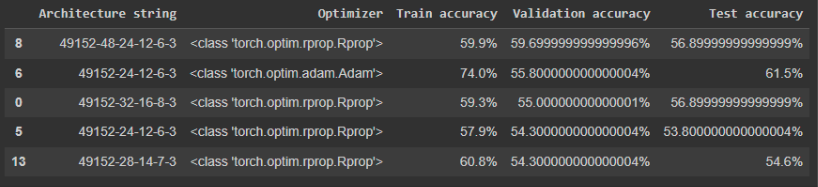

### PyTorch Regressor
   - The regressor model showed an immediate improvement in performance, achieving a validation mean squared error (MSE) of 0.011, indicating a strong predictive capability on the validation set.
   - Similar to the classifier, linear activation with ReLU was used, but Rprop stood out as the clearly superior optimizer, with performance less sensitive to the learning rate (eta). Good results were obtained across different magnitudes of eta, including 1e-2, 1e-3, and 1e-4.
   - Contrary to the classifier, the "trickle-down" structure was not necessarily advantageous for the regressor. This outcome may imply that different architectures are suited for classification versus regression tasks within the same domain.
   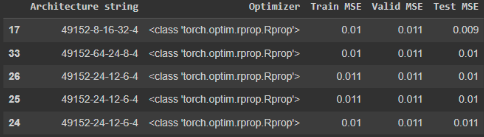

### Pytorch - Multi-Headed Model
- The multi-headed model, integrating the classification and bounding box regression into one pytorch neural network, was difficult to tune and extract performance from.
- Difficulties with these the pytorch models hints at a possible issue in the data handling prior to these models.
- However, upon experimentation across batch sizes, activation function, learning rate, and number of epochs, we were able to achieve an accuracy of 59.1, Avg. MSE of 0.0365, and Avg. IoU of 0.441.

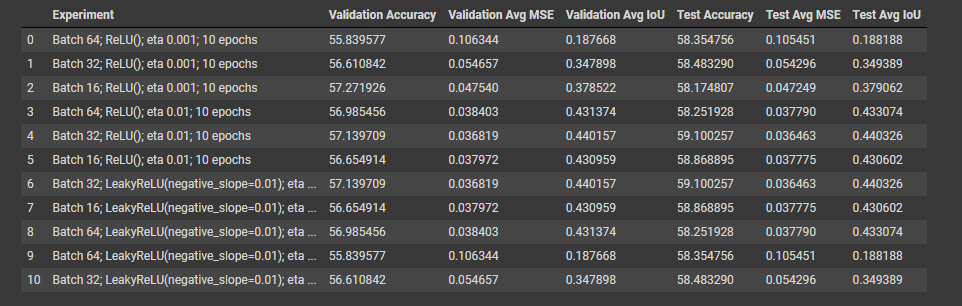

### Efficient Det

| Metric | EfficientDet-D0 | EfficientDet-D7 |
|--------|-----------------|-----------------|
| AP IoU=0.50:0.95 | 0.373 | 0.394 |
| AP IoU=0.50      | 0.478 | 0.481 |
| AP IoU=0.75      | 0.426 | 0.439 |
| AP Small Objects | -1.000 | -1.000 |
| AP Medium Objects| 0.344 | 0.365 |
| AP Large Objects | 0.389 | 0.410 |
| AR IoU=0.50:0.95 (maxDets=1) | 0.407 | 0.423 |
| AR IoU=0.50:0.95 (maxDets=10) | 0.425 | 0.440 |
| AR IoU=0.50:0.95 (maxDets=100) | 0.425 | 0.443 |
| AR Small Objects | -1.000 | -1.000 |
| AR Medium Objects | 0.399 | 0.422 |
| AR Large Objects | 0.439 | 0.454 |
| AP for Cats | 0.0 | 0.0 |
| AP for Dogs | 0.745 | 0.788 |
| Inference Time (s) | 45.82 | 35.82 |


**EfficientDet-D0:**

- **Average Precision (AP):**
  - The AP values across different Intersection over Union (IoU) thresholds (0.50:0.95) is 0.373, indicating moderate precision across these thresholds.
  - At IoU=0.50, the AP is higher at 0.478, suggesting better performance at lower thresholds.
  - AP for small objects is -1.000, indicating a failure in detecting small objects. For medium and large objects, the AP is 0.344 and 0.389, respectively, showing better performance on larger objects.

- **Average Recall (AR):**
  - The AR values are relatively consistent across different maximum detections, around 0.407-0.425, indicating the model’s capability to find a reasonable number of objects.

- **Inference Time:** The inference time is 45.81 seconds, which is the time taken for the model to process and output the results.

- **Class-specific Performance:** Notably, the AP for dogs (0.745) is much higher compared to cats (0.0), which indicates a significant bias towards dog detection.

**EfficientDet-D7:**

- **Average Precision (AP):**
  - Slightly better overall AP at 0.394 compared to D0, which increases to 0.481 at IoU=0.50. This indicates a small improvement in precision for D7.
  - Similar to D0, it fails to detect small objects (APs = -1.000) but shows slightly better performance on medium and large objects.

- **Average Recall (AR):**
  - Shows a slight improvement in recall compared to D0, with values around 0.423-0.443.

- **Inference Time:** Not provided, but typically D7 would have a longer inference time than D0 due to its higher complexity.

**Discussion:**

- Both models struggle with detecting small objects, as indicated by the AP and AR scores of -1.000 for small objects.
- The performance is better for larger objects, with D7 showing a marginal improvement over D0.
- There is a notable class imbalance issue, with the models significantly favoring dog detection over cat detection.


### YoloV8

With our custom dataset trained YoloV8 model, we then applied this model onto our test set of 996 images. We received good results of 82% of cat images correctly identified and 94% of dog images correctly identified. Going forward it would nice to expand the experimentaiton of the YoloV8 neural network, by testing on more models offered by YoloV8 as well as testing different numbers of training epochs, and different train/test splits

### FCN

The FCN model we made only predicts dogs, but even without a proper gridsearch to do hyperparameter tuning does well for bounding box prediction looking strictly at MSE. Further testing and experimentation with the model framework is required.

Some potential fixed include - cutoff for logit (closer to class imbalance), aligning the loss and accuracy function more closely, or there may be an input data issue.

We achieved a classification accuracy of 0.5312 and an MSE of 0.0208 on the test set.

### Gap Analysis

When comparing our results to the expectations of machine learning models, it would be difficult not to focus on the role that hardware limitations played. From the beginning of setting up training models in SKLearn from Phase2, the PyTorch training in phase 3, and the FCN, OOP API, and EfficientDET in Phase 4, we experienced hardware issues that vastly limited the amount of time we had to optimize our models for performance.

Going forward with this project we would need to establish a way to train our models using GPU's and larger memory capacities (either locally or via cloud).

Another issue we encountered, in part because of the hardware issues, was time being taken away from conducting hyperparameter tuninig and additional model evaluation. These steps would be useful in creating improved models through optimization of our existing algorithms.

## Conclusion

Our best models were: YoloV8 for classification, PyTorch Regression for bounding box prediction MSE, and EfficientDet-D7 for bounding box predicition IoU. The company-built models YoloV8 and EfficientDet performed very well, which our more homegrown models performed poorly. This is likely due to them having the time to create models that work more efficiently for our tasks. Therefore, with extra time we could create homegrown models, likely different forms of neural networks, that can compete with proven generalist models.

# Code Appendix

## Multiheaded Model

### Imports

In [ ]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
torch.cuda.is_available()

### Experiment Parameters for Testing

In [ ]:
# My experiment params
eta = 1e-3
batch_sz = 16
act_func = nn.LeakyReLU()
epochs = 100

### Converting, scaling, and loading data

In [ ]:
torch.manual_seed(0)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Scaling
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_validation = scaler.transform(X_validation) #Transform validation set with the same constants
X_test = scaler.transform(X_test) #Transform test set with the same constants

# Convert numpy arrays to tensors
X_train_tensor = torch.from_numpy(X_train)
X_validation_tensor = torch.from_numpy(X_validation)
X_test_tensor = torch.from_numpy(X_test)

y_train_tensor = torch.from_numpy(y_train)
y_test_tensor = torch.from_numpy(y_test)
y_validation_tensor = torch.from_numpy(y_validation)

reg_y_train_tensor = torch.from_numpy(reg_y_train)
reg_y_test_tensor = torch.from_numpy(reg_y_test)
reg_y_validation_tensor = torch.from_numpy(reg_y_validation)

# create TensorDataset in PyTorch
oop_train = torch.utils.data.TensorDataset(X_train_tensor, y_train_tensor, reg_y_train_tensor)
oop_validation = torch.utils.data.TensorDataset(X_validation_tensor, y_validation_tensor, reg_y_validation_tensor)
oop_test = torch.utils.data.TensorDataset(X_test_tensor, y_test_tensor, reg_y_test_tensor)

# Creating loaders
train_loader = DataLoader(oop_train, batch_size=batch_sz, shuffle=True, num_workers=0)
validation_loader = DataLoader(oop_validation, batch_size=batch_sz, shuffle=False, num_workers=0)
test_loader = DataLoader(oop_test, batch_size=batch_sz, shuffle=False, num_workers=0)

### Multiheaded Model Definition

In [ ]:
class MultiHeadedModel(nn.Module):
    def __init__(self, input_features, reg_output):
        super(MultiHeadedModel, self).__init__()

        # Shared layers
        self.shared_layers = nn.Sequential(
            nn.Linear(input_features, 1024),
            nn.ReLU(),
            nn.BatchNorm1d(1024),
            nn.Dropout(0.5),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.BatchNorm1d(512)
        )

        # Classification head
        self.classif_layers = nn.Sequential(
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.BatchNorm1d(256),
            nn.Dropout(0.5),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Linear(128, 1)  # Single output neuron for binary classification. Required due to BCEWithLogitsLoss
        )

        # Regression (bounding box) head
        self.reg_layers = nn.Sequential(
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.BatchNorm1d(256),
            nn.Dropout(0.5),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, reg_output)  # Output 4 nodes for bounding box
        )

    def forward(self, x):
        x = self.shared_layers(x)
        classif_output = self.classif_layers(x)
        reg_output = self.reg_layers(x)
        return classif_output, reg_output

# Instantiate the model
input_features = X_train.shape[1]
reg_output = 4  # For bounding box

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = MultiHeadedModel(input_features, reg_output)
model.to(device)

# Loss and Optimizer
def combined_loss_function(classif_preds, classif_targets, reg_preds, reg_targets, alpha=0.5, lambda_reg=0.01):
    classif_loss = nn.BCEWithLogitsLoss()(classif_preds, classif_targets.float())
    mse_loss = nn.MSELoss()(reg_preds, reg_targets)
    l2_reg = torch.tensor(0.).to(device)
    for param in model.parameters():
        l2_reg += torch.norm(param)
    reg_loss = mse_loss + lambda_reg * l2_reg
    return alpha * classif_loss + (1 - alpha) * reg_loss

optimizer = optim.SGD(model.parameters(), lr=eta)

# Training Loop
def train(model, train_loader, optimizer):
    model.train()
    total_loss = 0
    for X_batch, y_batch, reg_y_batch in train_loader:
        X_batch, y_batch, reg_y_batch = X_batch.to(device), y_batch.to(device), reg_y_batch.to(device)

        # Had to add an extra dimension here. Issue introduced due to using a single output neuron, which is required with BCE with logits loss...
        y_batch = y_batch.unsqueeze(1)

        optimizer.zero_grad()
        classif_preds, reg_preds = model(X_batch.float())
        loss = combined_loss_function(classif_preds, y_batch.float(), reg_preds, reg_y_batch.float())
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    avg_loss = total_loss / len(train_loader)
    return avg_loss

# IoU Function for eval
def iou(boxA, boxB):
    # Coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    # Area of intersection
    interArea = max(0, xB - xA) * max(0, yB - yA)

    # Area of bounding boxes
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    # Compute the intersection over union
    iou = interArea / float(boxAArea + boxBArea - interArea)

    return iou

# Eval function
def evaluate(model, data_loader):
    model.eval()
    total, correct = 0, 0
    total_reg_loss = 0
    total_iou = 0

    sigmoid = nn.Sigmoid()

    with torch.no_grad():
        for X_batch, y_batch, reg_y_batch in data_loader:
            X_batch, y_batch, reg_y_batch = X_batch.to(device), y_batch.to(device), reg_y_batch.to(device)

            classif_preds, reg_preds = model(X_batch.float())

            # Apply sigmoid to classif_preds and threshold for binary classification prediction
            predicted = sigmoid(classif_preds) > 0.5
            correct += (predicted.squeeze() == y_batch).sum().item() # Had to use squeeze again due to BCEWithLogitsLoss()
            total += y_batch.size(0)

            # Calculate MSE loss for regression
            reg_loss = nn.MSELoss()(reg_preds, reg_y_batch.float())
            total_reg_loss += reg_loss.item()

            # Calculate IoU for each prediction
            for pred, true in zip(reg_preds, reg_y_batch):
                total_iou += iou(pred.tolist(), true.tolist())

    accuracy = 100 * correct / total
    avg_reg_loss = total_reg_loss / len(data_loader)
    avg_iou = total_iou / (len(data_loader) * data_loader.batch_size)

    return accuracy, avg_reg_loss, avg_iou


In [ ]:
# Training call
for epoch in range(epochs):
    train_loss = train(model, train_loader, optimizer)
    print(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}")

This model was executed in another notebook (locally, using cuda). So, this is just a copy of a portion of that output.

... <br>
Epoch 89, Train Loss: 0.8961 <br>
Epoch 90, Train Loss: 0.8916 <br>
Epoch 91, Train Loss: 0.8924 <br>
Epoch 92, Train Loss: 0.8924 <br>
Epoch 93, Train Loss: 0.8943 <br>
Epoch 94, Train Loss: 0.8894 <br>
Epoch 95, Train Loss: 0.8885 <br>
Epoch 96, Train Loss: 0.8894 <br>
Epoch 97, Train Loss: 0.8930 <br>
Epoch 98, Train Loss: 0.8875 <br>
Epoch 99, Train Loss: 0.8830 <br>
Epoch 100, Train Loss: 0.8878 <br>

In [ ]:
# Validation call
validation_accuracy, validation_avg_reg_loss, validation_avg_iou = evaluate(model, validation_loader)

print(f"Validation Accuracy: {validation_accuracy:.2f}%")
print(f"Validation Average Regression MSE: {validation_avg_reg_loss:.4f}")
print(f"Validation Average IoU: {validation_avg_iou:.4f}")

Again, output copied to markdown from execution notebook.

Validation Accuracy: 53.72% <br>
Validation Average Regression MSE: 0.0366 <br>
Validation Average IoU: 0.4362 <br>

In [ ]:
# Test call
test_accuracy, test_avg_reg_loss, test_avg_iou = evaluate(model, test_loader)

print(f"Test Accuracy: {test_accuracy:.2f}%")
print(f"Test Average Regression MSE: {test_avg_reg_loss:.4f}")
print(f"Test Average IoU: {test_avg_iou:.4f}")

Again, output copied to markdown from execution notebook.

Test Accuracy: 54.19% <br>
Test Average Regression MSE: 0.0365 <br>
Test Average IoU: 0.4355 <br>

### Storing Experiment Results

In [ ]:
# Function to add a new row to the DataFrame
def add_experiment_results(experiment_desc, val_metrics, test_metrics):
    global results_df
    new_row = {
        'Experiment': experiment_desc,
        'Validation Accuracy': val_metrics['accuracy'],
        'Validation Avg MSE': val_metrics['avg_mse'],
        'Validation Avg IoU': val_metrics['avg_iou'],
        'Test Accuracy': test_metrics['accuracy'],
        'Test Avg MSE': test_metrics['avg_mse'],
        'Test Avg IoU': test_metrics['avg_iou']
    }
    results_df = pd.concat([results_df, pd.DataFrame([new_row])], ignore_index=True)

# Example usage
experiment_description = f"Batch {batch_sz}; {act_func}; eta {eta}; {epochs} epochs"

# Variables for metrics
val_metrics = {'accuracy': validation_accuracy, 'avg_mse': validation_avg_reg_loss, 'avg_iou': validation_avg_iou}
test_metrics = {'accuracy': test_accuracy, 'avg_mse': test_avg_reg_loss, 'avg_iou': test_avg_iou}

# Add the results to the DataFrame
add_experiment_results(experiment_description, val_metrics, test_metrics)

# Display the DataFrame
results_df

|  | Experiment | Validation Accuracy | Validation Avg MSE | Validation Avg IoU | Test Accuracy | Test Avg MSE | Test Avg IoU |
| :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- |
| 0 | Batch 64; ReLU\(\); eta 0.001; 10 epochs | 55.839577 | 0.106344 | 0.187668 | 58.354756 | 0.105451 | 0.188188 |
| 1 | Batch 32; ReLU\(\); eta 0.001; 10 epochs | 56.610842 | 0.054657 | 0.347898 | 58.483290 | 0.054296 | 0.349389 |
| 2 | Batch 16; ReLU\(\); eta 0.001; 10 epochs | 57.271926 | 0.047540 | 0.378522 | 58.174807 | 0.047249 | 0.379062 |
| 3 | Batch 64; ReLU\(\); eta 0.01; 10 epochs | 56.985456 | 0.038403 | 0.431374 | 58.251928 | 0.037790 | 0.433074 |
| 4 | Batch 32; ReLU\(\); eta 0.01; 10 epochs | 57.139709 | 0.036819 | 0.440157 | 59.100257 | 0.036463 | 0.440326 |
| 5 | Batch 16; ReLU\(\); eta 0.01; 10 epochs | 56.654914 | 0.037972 | 0.430959 | 58.868895 | 0.037775 | 0.430602 |
| 6 | Batch 32; LeakyReLU\(negative\_slope=0.01\); eta ... | 57.139709 | 0.036819 | 0.440157 | 59.100257 | 0.036463 | 0.440326 |
| 7 | Batch 16; LeakyReLU\(negative\_slope=0.01\); eta ... | 56.654914 | 0.037972 | 0.430959 | 58.868895 | 0.037775 | 0.430602 |
| 8 | Batch 64; LeakyReLU\(negative\_slope=0.01\); eta ... | 56.985456 | 0.038403 | 0.431374 | 58.251928 | 0.037790 | 0.433074 |
| 9 | Batch 64; LeakyReLU\(negative\_slope=0.01\); eta ... | 55.839577 | 0.106344 | 0.187668 | 58.354756 | 0.105451 | 0.188188 |
| 10 | Batch 32; LeakyReLU\(negative\_slope=0.01\); eta ... | 56.610842 | 0.054657 | 0.347898 | 58.483290 | 0.054296 | 0.349389 |


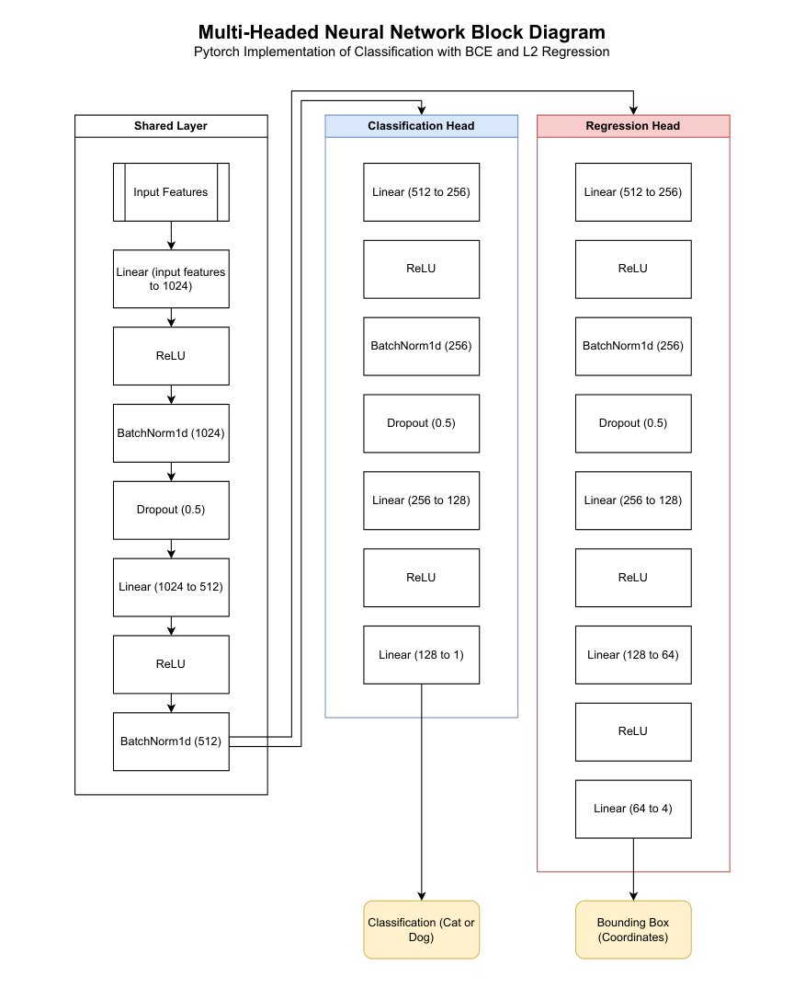

## Transer Learning for Object Detection and Fine-tuning- EfficientDet

EfficientDet is an object detection model known for its efficiency and effectiveness, stemming from its scalable architecture. It builds on the EfficientNet backbone for feature extraction, combined with a bidirectional Feature Pyramid Network (BiFPN) for feature fusion, enabling rich multi-scale feature representation. EfficientDet also employs compound scaling, a systematic and uniform scaling method across the resolution, depth, and width of the network, enhancing its performance.

The loss function in EfficientDet is a combination of focal loss for classification and box regression loss for localization. Focal loss, defined as

$$-\alpha (1-p)^\gamma \log(p)$$

where \(p\) is the probability of the correct class, helps in handling the class imbalance issue by reducing the weight of easy negatives. The box regression loss is a smooth L1 loss, also known as Huber loss, defined as:

$$
L_{\text{Huber}}(x) =
\begin{cases}
0.5x^2, & \text{if } |x| < 1 \\
|x| - 0.5, & \text{otherwise}
\end{cases}
$$

This loss is less sensitive to outliers than L2 loss.

The EfficientDet family includes several models (D0 to D7) with increasing complexity. D0 is the smallest and fastest variant, designed for lower resource requirements, while D7 is significantly larger and more accurate, suitable for high-resource scenarios. The primary differences between D0 and D7 lie in their depth, width, and input resolution, with D7 having more layers, wider channels, and a higher input resolution, resulting in better performance but higher computational costs.


### EfficientDet-d0

#### Annotations/TFRecords Creation

In [ ]:
import os
import tensorflow.compat.v1 as tf
from sklearn.model_selection import train_test_split
import numpy as np
from PIL import Image
from io import BytesIO
import re
import hashlib

In [ ]:
CAT_CLASS = 0
DOG_CLASS = 1

def create_example(id, image_array, label, bbox):
    # Reshape the flattened image array back to its original dimensions
    image_array_reshaped = image_array.reshape((128, 128, 3))

    # Convert the numpy array to an Image object
    img = Image.fromarray(image_array_reshaped.astype('uint8'), 'RGB')
    img_byte_arr = BytesIO()
    img.save(img_byte_arr, format='JPEG')
    img_raw = img_byte_arr.getvalue()
    key = hashlib.sha256(img_raw).hexdigest()

    width, height = img.size

    label_class = CAT_CLASS if label == 0 else DOG_CLASS

    example = tf.train.Example(features=tf.train.Features(feature={
        "image/height": tf.train.Feature(int64_list=tf.train.Int64List(value=[height])),
        "image/width": tf.train.Feature(int64_list=tf.train.Int64List(value=[width])),
        "image/filename": tf.train.Feature(bytes_list=tf.train.BytesList(value=[str(id).encode("utf-8")])),
        "image/source_id": tf.train.Feature(bytes_list=tf.train.BytesList(value=[str(id).encode("utf-8")])),
        "image/key/sha256": tf.train.Feature(bytes_list=tf.train.BytesList(value=[key.encode("utf-8")])),
        "image/encoded": tf.train.Feature(bytes_list=tf.train.BytesList(value=[img_raw])),
        "image/format": tf.train.Feature(bytes_list=tf.train.BytesList(value=["jpg".encode("utf8")])),
        "image/object/bbox/xmin": tf.train.Feature(float_list=tf.train.FloatList(value=[bbox[0]])),
        "image/object/bbox/xmax": tf.train.Feature(float_list=tf.train.FloatList(value=[bbox[2]])),
        "image/object/bbox/ymin": tf.train.Feature(float_list=tf.train.FloatList(value=[bbox[1]])),
        "image/object/bbox/ymax": tf.train.Feature(float_list=tf.train.FloatList(value=[bbox[3]])),
        "image/object/class/text": tf.train.Feature(bytes_list=tf.train.BytesList(value=[("dog" if label == 1 else "cat").encode("utf-8")])),
        "image/object/class/label": tf.train.Feature(int64_list=tf.train.Int64List(value=[label_class])),
        "image/object/difficult": tf.train.Feature(int64_list=tf.train.Int64List(value=[0])),
        "image/object/truncated": tf.train.Feature(int64_list=tf.train.Int64List(value=[0])),
        "image/object/view": tf.train.Feature(bytes_list=tf.train.BytesList(value=["Unspecified".encode("utf-8")])),
    }))
    return example


def create_tfrecord(X, y_label, y_bbox, output_path):
    print(f"Creating TFRecord at {output_path}")

    output_dir = os.path.dirname(output_path)
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Write examples into TFRecord
    with tf.io.TFRecordWriter(output_path) as writer:
        for i, (image_array, label, bbox) in enumerate(zip(X, y_label, y_bbox)):
            example = create_example(i + 1, image_array, label, bbox)
            writer.write(example.SerializeToString())

    print(f"TFRecord saved at {output_path}")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
os.chdir('/content/')
X = np.load('drive/MyDrive/cadod_data/data/img.npy', allow_pickle=True)
y_label = np.load('drive/MyDrive/cadod_data/data/y_label.npy', allow_pickle=True)
y_bbox = np.load('drive/MyDrive/cadod_data/data/y_bbox.npy', allow_pickle=True)

In [ ]:
X_train, X_test, y_train_label, y_test_label, y_train_bbox, y_test_bbox = train_test_split(
    X, y_label, y_bbox, test_size=0.1, random_state=27, stratify=y_label)
# Further split for validation set
X_train, X_val, y_train_label, y_val_label, y_train_bbox, y_val_bbox = train_test_split(
    X_train, y_train_label, y_train_bbox, test_size=0.1, random_state=27, stratify=y_train_label)


In [ ]:
create_tfrecord(X_train, y_train_label, y_train_bbox, "/content/train.tfrecord")
create_tfrecord(X_val, y_val_label, y_val_bbox, "/content/val.tfrecord")
create_tfrecord(X_test, y_test_label, y_test_bbox, "/content/test.tfrecord")

Creating TFRecord at /content/train.tfrecord
TFRecord saved at /content/train.tfrecord
Creating TFRecord at /content/val.tfrecord
TFRecord saved at /content/val.tfrecord
Creating TFRecord at /content/test.tfrecord
TFRecord saved at /content/test.tfrecord


#### Creating the config YAML file

In [ ]:
import os

PROJ_DIR = "/content/"
CONFIG_DIR = os.path.join(PROJ_DIR, "configs")
CONFIG_FILE = os.path.join(CONFIG_DIR, "cadod_config.yaml")

if not os.path.exists(CONFIG_DIR):
    os.mkdir(CONFIG_DIR)

config_text = \
"""image_size: 128x128  # Size of your images
num_classes: 2  # Number of classes, 2 for cats and dogs
label_map: {0: cat, 1: dog}  # Label mapping
input_rand_hflip: true  # Random horizontal flip
jitter_min: 0.8  # Minimum jitter for data augmentation
jitter_max: 1.2  # Maximum jitter for data augmentation
"""

with open(CONFIG_FILE, "w") as fwrite:
    fwrite.write(config_text)

print(f"Configuration file created at {CONFIG_FILE}")


Configuration file created at /content/configs/cadod_config.yaml


#### Download the code and pretrained model

In [ ]:
import os
import sys

# Clone the EfficientDet repository
!git clone --depth 1 https://github.com/google/automl
os.chdir('automl/efficientdet')
sys.path.append('.')

# Install requirements
!pip install -r requirements.txt
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

Cloning into 'automl'...
remote: Enumerating objects: 176, done.
remote: Counting objects: 100% (176/176), done.
remote: Compressing objects: 100% (173/173), done.
remote: Total 176 (delta 16), reused 64 (delta 0), pack-reused 0
Receiving objects: 100% (176/176), 13.77 MiB | 9.80 MiB/s, done.
Resolving deltas: 100% (16/16), done.
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-i1_50ftx
  Running command git clone --filter=blob:none --quiet https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-i1_50ftx
  Resolved https://github.com/cocodataset/cocoapi.git to commit 8c9bcc3cf640524c4c20a9c40e89cb6a2f2fa0e9
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 48.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 59.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.6/128.6 kB 20.0 MB/s eta 0:00:00
  Created wheel for pycocotools: filename=pycocotools-2.0-cp310-cp3

  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-y6d78jdh
  Running command git clone --filter=blob:none --quiet https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-y6d78jdh
  Resolved https://github.com/cocodataset/cocoapi.git to commit 8c9bcc3cf640524c4c20a9c40e89cb6a2f2fa0e9
  Preparing metadata (setup.py) ... done


In [ ]:
import os
import tensorflow.compat.v1 as tf

def download_model(model_name):
    base_url = 'https://storage.googleapis.com/cloud-tpu-checkpoints/efficientdet/coco/'
    model_tar = f'{model_name}.tar.gz'
    model_url = f'{base_url}{model_tar}'

    if model_name not in os.listdir():
        !wget {model_url}
        !tar zxf {model_tar}

    ckpt_path = model_name
    return ckpt_path

MODEL = 'efficientdet-d0'  # or 'efficientdet-d7'
ckpt_path = download_model(MODEL)
print(f'Checkpoint directory path: {ckpt_path}')

--2023-12-05 23:39:43--  https://storage.googleapis.com/cloud-tpu-checkpoints/efficientdet/coco/efficientdet-d0.tar.gz
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.68.207, 64.233.170.207, 142.251.175.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.68.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 28994253 (28M) [application/octet-stream]
Saving to: ‘efficientdet-d0.tar.gz’

efficientdet-d0.tar 100%[===================>]  27.65M  11.4MB/s    in 2.4s    

2023-12-05 23:39:47 (11.4 MB/s) - ‘efficientdet-d0.tar.gz’ saved [28994253/28994253]

Checkpoint directory path: efficientdet-d0


In [ ]:
MODEL_DIR_TMP = os.path.join(PROJ_DIR, "tmp", f"{MODEL}-finetune")

#### Train the Model

In [ ]:
if os.path.exists(MODEL_DIR_TMP):
    !rm -rf {MODEL_DIR_TMP}

In [ ]:
!python main.py --mode=train_and_eval \
    --train_file_pattern='/content/train.tfrecord' \
    --val_file_pattern='/content/val.tfrecord' \
    --model_name={MODEL} \
    --model_dir={MODEL_DIR_TMP} \
    --ckpt={ckpt_path} \
    --train_batch_size=32 \
    --eval_batch_size=32 \
    --eval_samples=1167 \
    --num_examples_per_epoch=5000 \
    --num_epochs=10 \
    --hparams={CONFIG_FILE}

2023-12-05 23:39:48.461817: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-05 23:39:48.461883: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-05 23:39:48.461923: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-05 23:39:49.543959: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
I1205 23:39:52.234888 137448044765824 main.py:228] {'name': 'efficientdet-d0', 'act_type': 'swish', 'image_size': (128, 128), 'target_size': None, 'input_rand_hflip': True, 'jitter_min': 0.8, 'jitter_max': 1.2, 'autoaugment_policy': None,

#### D0 Inference

In [ ]:
import os
from IPython.display import Image, display

MODEL_DIR_EXPORT = os.path.join(PROJ_DIR, "models", f"{MODEL}-finetune")

MIN_SCORE_THRESHOLD = 0.1

# Exporting the model for inference
!python -m model_inspect \
    --runmode=saved_model \
    --model_name={MODEL} \
    --ckpt_path={MODEL_DIR_TMP} \
    --saved_model_dir={MODEL_DIR_EXPORT} \
    --min_score_thresh={MIN_SCORE_THRESHOLD} \
    --hparams={CONFIG_FILE}

2023-12-06 00:11:39.609644: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-06 00:11:39.609707: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-06 00:11:39.609751: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-06 00:11:41.850097: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-12-06 00:11:47.023838: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
Instructions for updat

In [ ]:
import os
from PIL import Image
import numpy as np

# Create a directory for test images
TEST_IMAGE_DIR = '/content/test_images'
os.makedirs(TEST_IMAGE_DIR, exist_ok=True)

for i, image in enumerate(X_test):
    # Reshape and convert the image data to uint8
    image_reshaped = image.reshape((128, 128, 3)).astype(np.uint8)
    img = Image.fromarray(image_reshaped)

    # Save each image as a JPG file
    img.save(os.path.join(TEST_IMAGE_DIR, f'test_image_{i}.jpg'))


In [ ]:
TEST_IMAGE_FILES = os.path.join(TEST_IMAGE_DIR, "*.jpg")

RESULT_DIR = os.path.join(PROJ_DIR, "d0-results")
if not os.path.exists(RESULT_DIR):
    os.mkdir(RESULT_DIR)

# Running inference on the test images
!python -m model_inspect \
    --runmode=saved_model_infer \
    --saved_model_dir={MODEL_DIR_EXPORT} \
    --model_name={MODEL} \
    --input_image={TEST_IMAGE_FILES} \
    --output_image_dir={RESULT_DIR} \
    --min_score_thresh=0.5 \
    --hparams={CONFIG_FILE}

2023-12-06 00:12:26.786889: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-06 00:12:26.786947: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-06 00:12:26.786987: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-06 00:12:28.284612: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-12-06 00:12:31.150676: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
Instructions for updat

##### Visualization

/content/d0-results/0.jpg


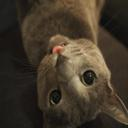

/content/d0-results/1.jpg


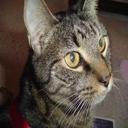

/content/d0-results/2.jpg


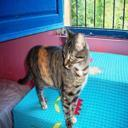

/content/d0-results/3.jpg


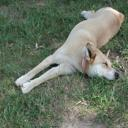

/content/d0-results/4.jpg


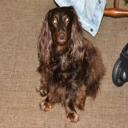

In [ ]:
from IPython.display import Image as DisplayImage
import os

MAX_SHOW_RESULTS = 5

for i in range(MAX_SHOW_RESULTS):
    fname = os.path.join(RESULT_DIR, f"{i}.jpg")
    if os.path.exists(fname):
        print(fname)
        display(DisplayImage(fname))

### EfficientDet-d7

In [ ]:
import os
import tensorflow.compat.v1 as tf

def download_model(model_name):
    base_url = 'https://storage.googleapis.com/cloud-tpu-checkpoints/efficientdet/coco/'
    model_tar = f'{model_name}.tar.gz'
    model_url = f'{base_url}{model_tar}'

    if model_name not in os.listdir():
        !wget {model_url}
        !tar zxf {model_tar}

    ckpt_path = model_name
    return ckpt_path

MODEL = 'efficientdet-d7'
ckpt_path = download_model(MODEL)
print(f'Checkpoint directory path: {ckpt_path}')

--2023-12-05 22:19:47--  https://storage.googleapis.com/cloud-tpu-checkpoints/efficientdet/coco/efficientdet-d7.tar.gz
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.142.207, 74.125.195.207, 172.253.117.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.142.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 413468440 (394M) [application/x-tar]
Saving to: ‘efficientdet-d7.tar.gz’

efficientdet-d7.tar 100%[===================>] 394.31M   130MB/s    in 3.0s    

2023-12-05 22:19:50 (130 MB/s) - ‘efficientdet-d7.tar.gz’ saved [413468440/413468440]

Checkpoint directory path: efficientdet-d7


In [ ]:
MODEL_DIR_TMP = os.path.join(PROJ_DIR, "tmp", f"{MODEL}-finetune")

In [ ]:
if os.path.exists(MODEL_DIR_TMP):
    !rm -rf {MODEL_DIR_TMP}

In [ ]:
!python main.py --mode=train_and_eval \
    --train_file_pattern='/content/train.tfrecord' \
    --val_file_pattern='/content/val.tfrecord' \
    --model_name={MODEL} \
    --model_dir={MODEL_DIR_TMP} \
    --ckpt={ckpt_path} \
    --train_batch_size=32 \
    --eval_batch_size=32 \
    --eval_samples=1167 \
    --num_examples_per_epoch=5000 \
    --num_epochs=10 \
    --hparams={CONFIG_FILE}

2023-12-05 22:19:58.598233: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-05 22:19:58.598308: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-05 22:19:58.598350: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-05 22:20:00.161938: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
I1205 22:20:02.236753 132686955139072 main.py:228] {'name': 'efficientdet-d7', 'act_type': 'swish', 'image_size': (128, 128), 'target_size': None, 'input_rand_hflip': True, 'jitter_min': 0.8, 'jitter_max': 1.2, 'autoaugment_policy': None,

#### D7 Inference

In [ ]:
import os
from IPython.display import Image, display

MODEL_DIR_EXPORT = os.path.join(PROJ_DIR, "models", f"{MODEL}-finetune")

MIN_SCORE_THRESHOLD = 0.1

# Exporting the model for inference
!python -m model_inspect \
    --runmode=saved_model \
    --model_name={MODEL} \
    --ckpt_path={MODEL_DIR_TMP} \
    --saved_model_dir={MODEL_DIR_EXPORT} \
    --min_score_thresh={MIN_SCORE_THRESHOLD} \
    --hparams={CONFIG_FILE}

2023-12-05 22:59:57.018039: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-05 22:59:57.018115: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-05 22:59:57.022226: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-05 22:59:59.957024: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-12-05 23:00:07.613522: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
Instructions for updat

In [ ]:

TEST_IMAGE_FILES = os.path.join(TEST_IMAGE_DIR, "*.jpg")

RESULT_DIR = os.path.join(PROJ_DIR, "d7-results")
if not os.path.exists(RESULT_DIR):
    os.mkdir(RESULT_DIR)

# Running inference on the test images
!python -m model_inspect \
    --runmode=saved_model_infer \
    --saved_model_dir={MODEL_DIR_EXPORT} \
    --model_name={MODEL} \
    --input_image={TEST_IMAGE_FILES} \
    --output_image_dir={RESULT_DIR} \
    --min_score_thresh=0.5 \
    --hparams={CONFIG_FILE}

2023-12-05 23:01:45.468647: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-05 23:01:45.468704: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-05 23:01:45.468748: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-05 23:01:46.492641: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-12-05 23:01:49.341051: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
Instructions for updat

##### Visualization

/content/d7-results/0.jpg


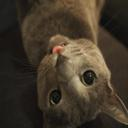

/content/d7-results/1.jpg


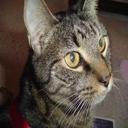

/content/d7-results/2.jpg


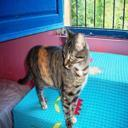

/content/d7-results/3.jpg


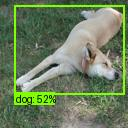

/content/d7-results/4.jpg


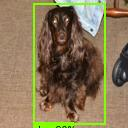

/content/d7-results/5.jpg


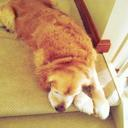

/content/d7-results/6.jpg


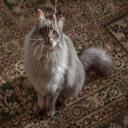

/content/d7-results/7.jpg


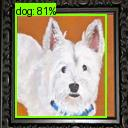

/content/d7-results/8.jpg


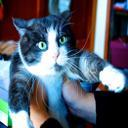

/content/d7-results/9.jpg


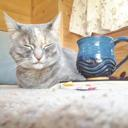

/content/d7-results/10.jpg


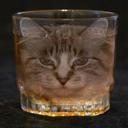

/content/d7-results/11.jpg


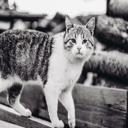

/content/d7-results/12.jpg


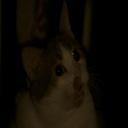

/content/d7-results/13.jpg


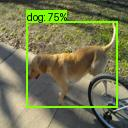

/content/d7-results/14.jpg


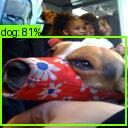

/content/d7-results/15.jpg


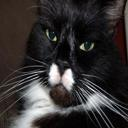

/content/d7-results/16.jpg


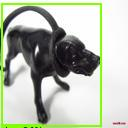

/content/d7-results/17.jpg


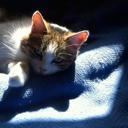

/content/d7-results/18.jpg


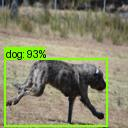

/content/d7-results/19.jpg


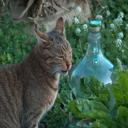

In [ ]:
from IPython.display import Image as DisplayImage
import os

MAX_SHOW_RESULTS =20
for i in range(MAX_SHOW_RESULTS):
    fname = os.path.join(RESULT_DIR, f"{i}.jpg")
    if os.path.exists(fname):
        print(fname)
        display(DisplayImage(fname))

## YoloV8

### Connecting to GPU to Run training faster

In [ ]:
!nvidia-smi

Tue Dec  5 22:38:59 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

### Installing UltraLytics to use YoloV8 Package

In [ ]:
! pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 654.0/654.0 kB 4.4 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image

### Downloading my YoloV8 Model

I chose to go with the medium YoloV8 option, as it seemed the best comination of speed and accuracy

In [ ]:
model = YOLO("yolov8m.pt")

100%|██████████| 49.7M/49.7M [00:00<00:00, 193MB/s]


### Installing RoboFlow to connect to custom YoloV8 Dataset

YoloV8 requrired a very specific data format to ingest images and bounding box data to train. I used RoboFlow and uploaded the images and the bounding boxes to the website to automatically create a YoloV8 compatible dataset

In [ ]:
! pip install roboflow --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.5/68.5 kB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.2/72.2 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.3 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires kaleido, which is not installed.
lida 0.0.10 requires python-multipart, which is not installed.
lida 0.0

### Downloading my project data from RoboFlow

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="Mod5RYxhTIho7JbJ5LKw")
project = rf.workspace("cadod").project("cadod-cefk3")
dataset = project.version(1).download("yolov8")

mkdir: cannot create directory ‘{HOME}/datasets’: No such file or directory
[Errno 2] No such file or directory: '{HOME}/datasets'
/content
loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.0.222, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to CaDoD-1 in yolov8:: 100%|██████████| 9712/9712 [00:01<00:00, 6919.25it/s]


### Training a YoloV8 model on my custom dataset ov cat and dog images

In [ ]:

!yolo task=detect mode=train model="/content/yolov8s.pt" data="/content/CaDoD-1/data.yaml" epochs=25 imgsz=800 plots=True

100% 21.5M/21.5M [00:00<00:00, 171MB/s] 
Ultralytics YOLOv8.0.222 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/yolov8s.pt, data=/content/CaDoD-1/data.yaml, epochs=25, patience=50, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=Tru

### Showing YoloV8 Training Results

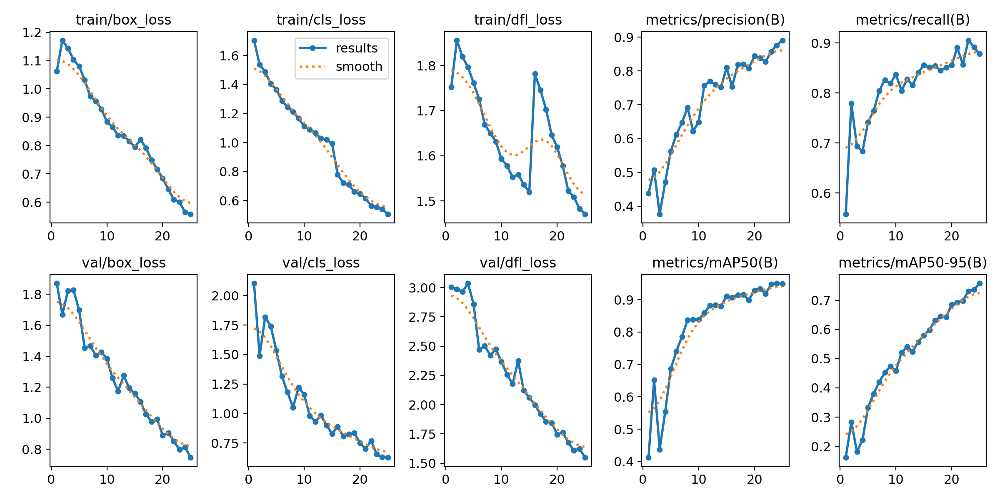

In [ ]:
Image(filename = "/content/runs/detect/train/results.png")

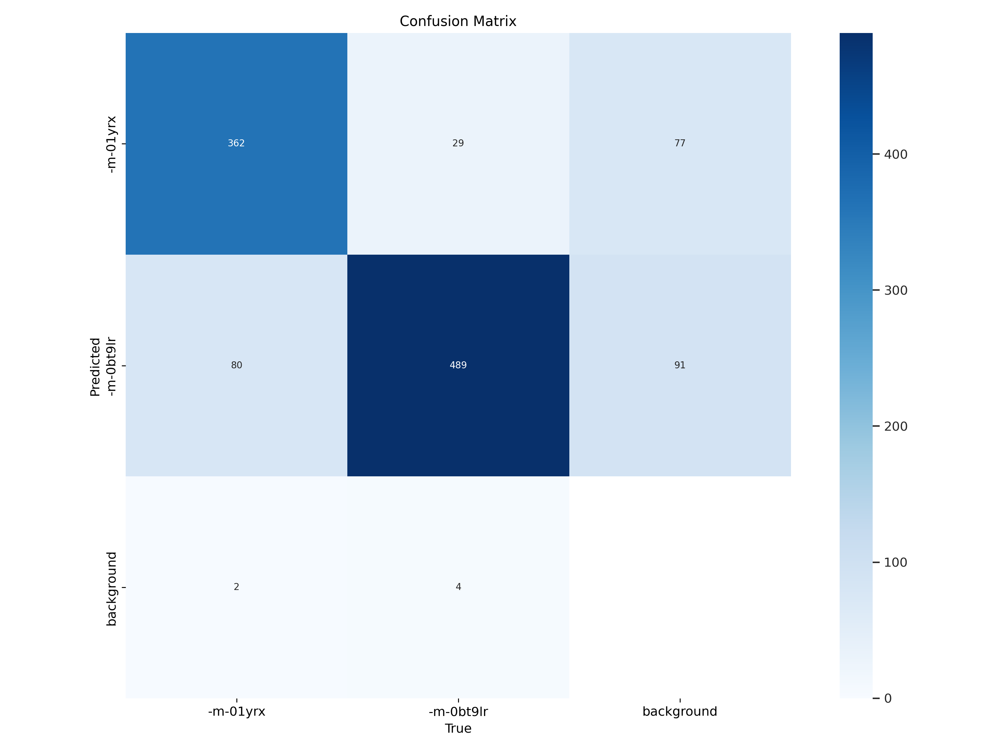

In [ ]:
Image(filename = '/content/runs/detect/train/confusion_matrix.png')

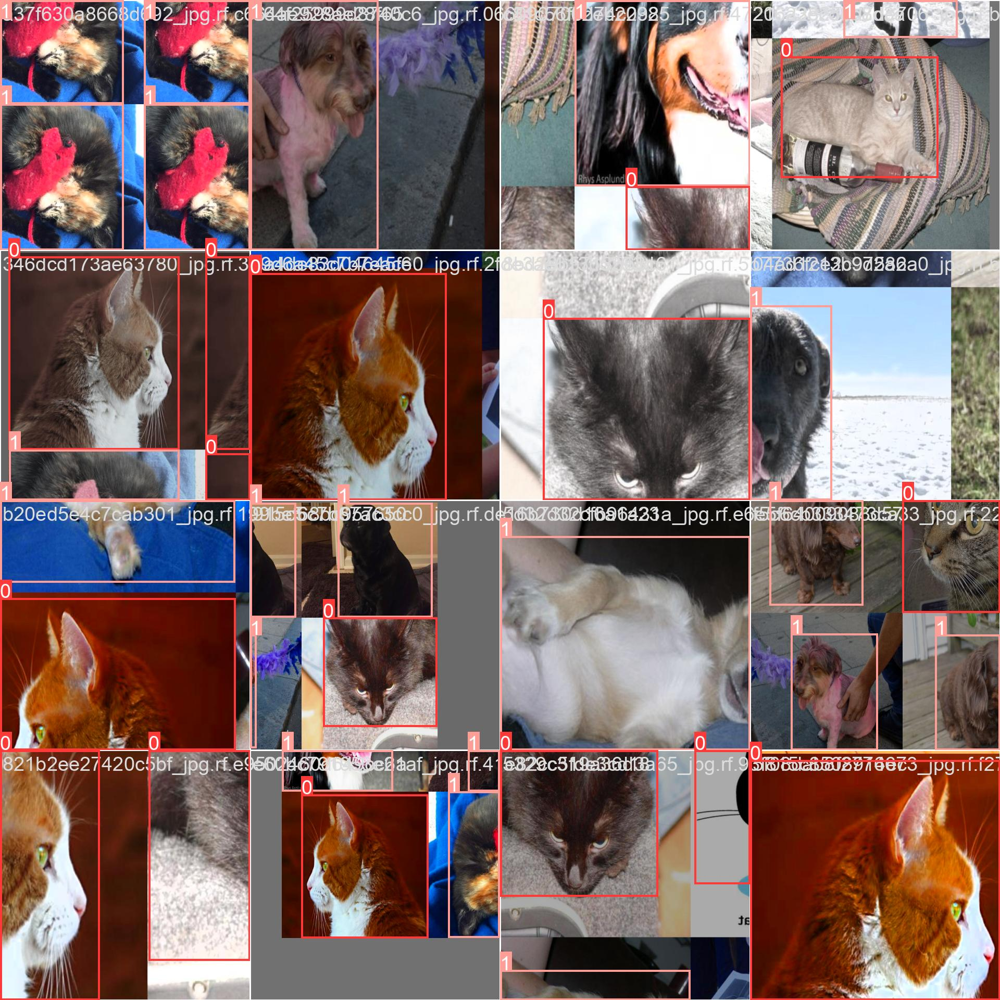

In [ ]:
Image(filename = '/content/runs/detect/train/train_batch0.jpg')

### Running detection based on my best YoloV8 training model

In [ ]:
!yolo task=detect mode=val model = "/content/runs/detect/train/weights/best.pt" data="/content/CaDoD-1/data.yaml"

Ultralytics YOLOv8.0.222 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/CaDoD-1/CaDoD-1/valid/labels.cache... 966 images, 0 backgrounds, 0 corrupt: 100% 966/966 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 61/61 [00:19<00:00,  3.10it/s]
                   all        966        966      0.891      0.877      0.949      0.758
              -m-01yrx        966        444      0.922      0.828      0.952       0.76
             -m-0bt9lr        966        522      0.861      0.925      0.945      0.755
Speed: 1.0ms preprocess, 12.7ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


### Showing Results of running the test data on the best YoloV8 dataset

#### Including F1 curve, P Curve, R Curve, and Confusion Matrix of results

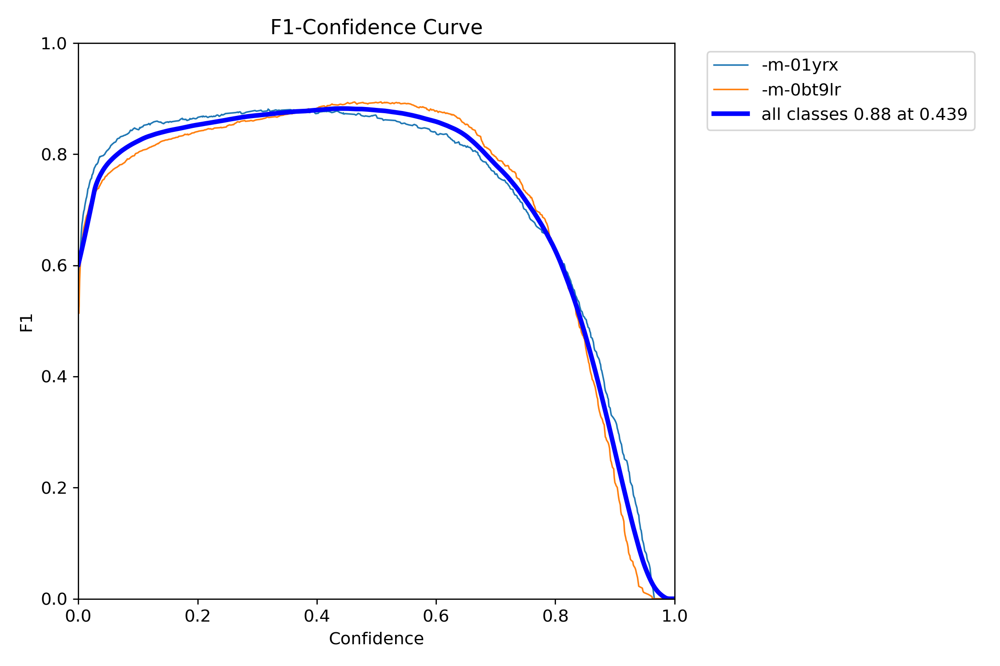

In [ ]:
Image(filename = "/content/runs/detect/val/F1_curve.png")

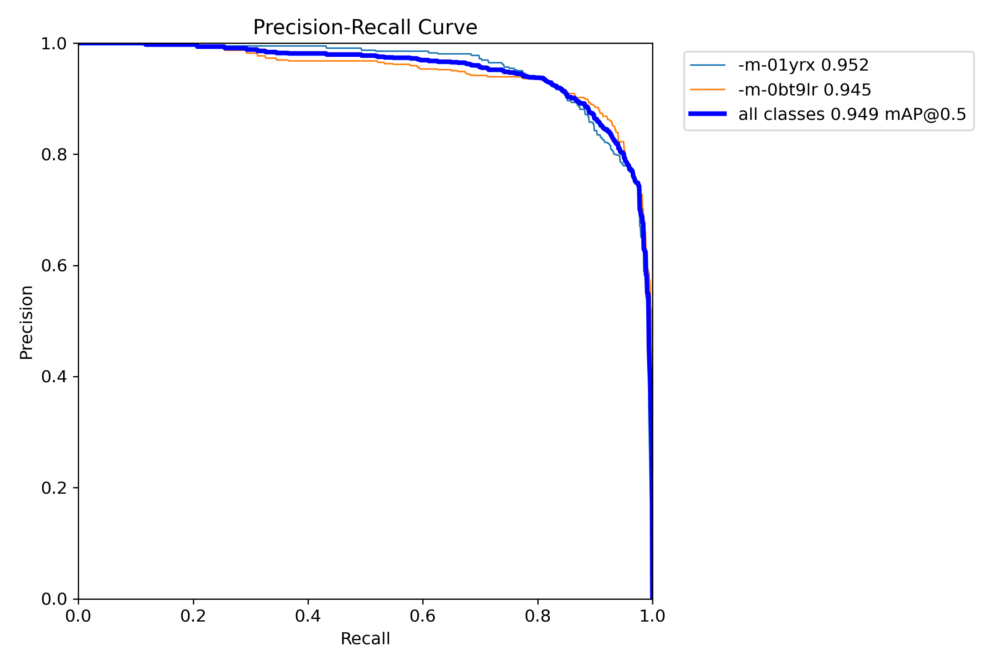

In [ ]:
Image(filename = "/content/runs/detect/val/PR_curve.png")

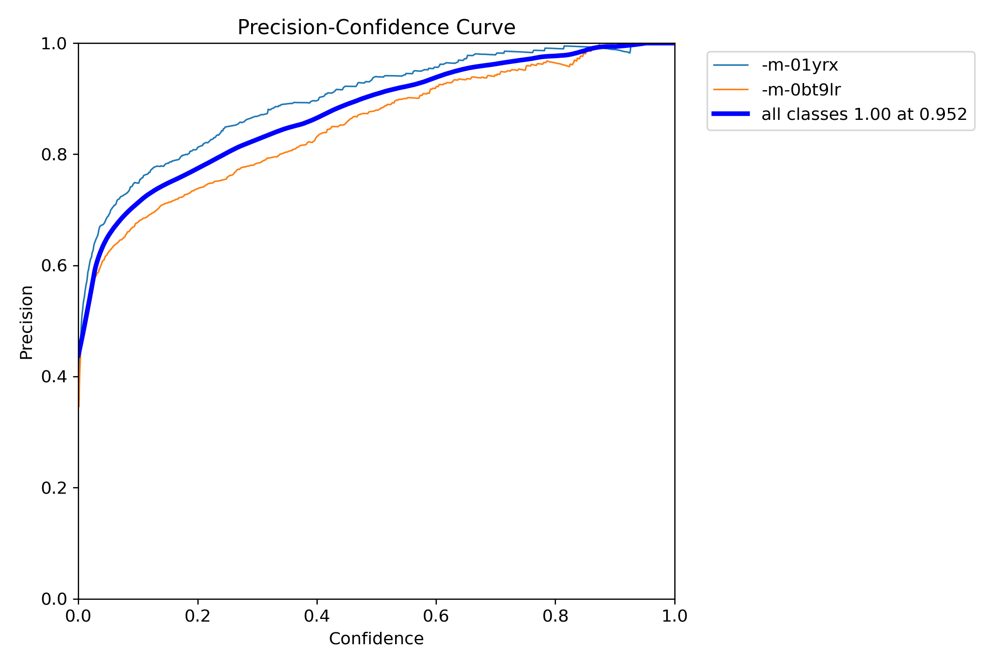

In [ ]:
Image(filename = "/content/runs/detect/val/P_curve.png")

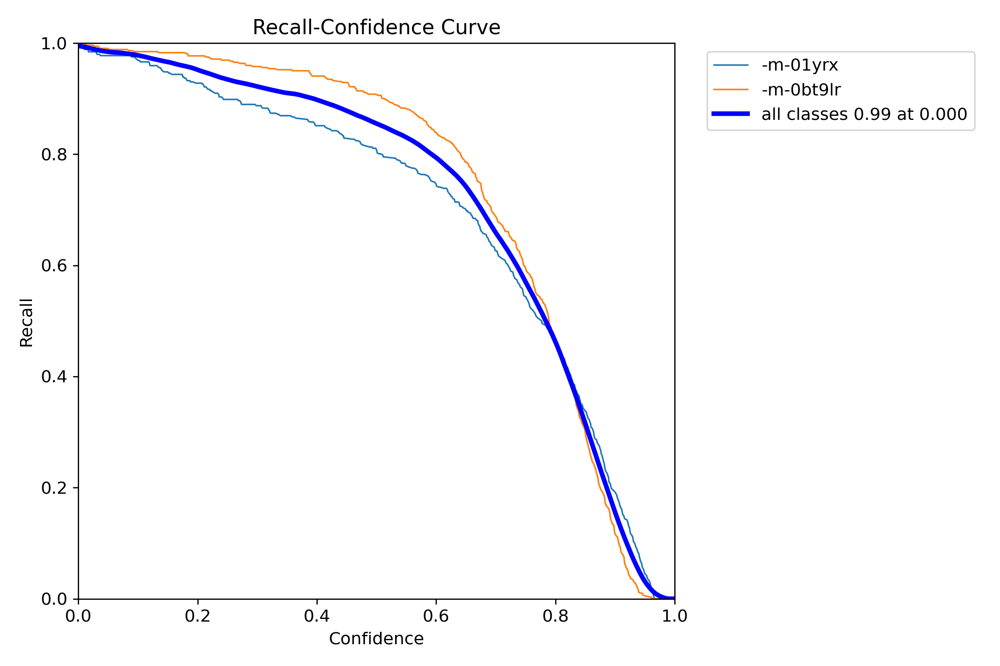

In [ ]:
Image(filename = "/content/runs/detect/val/R_curve.png")

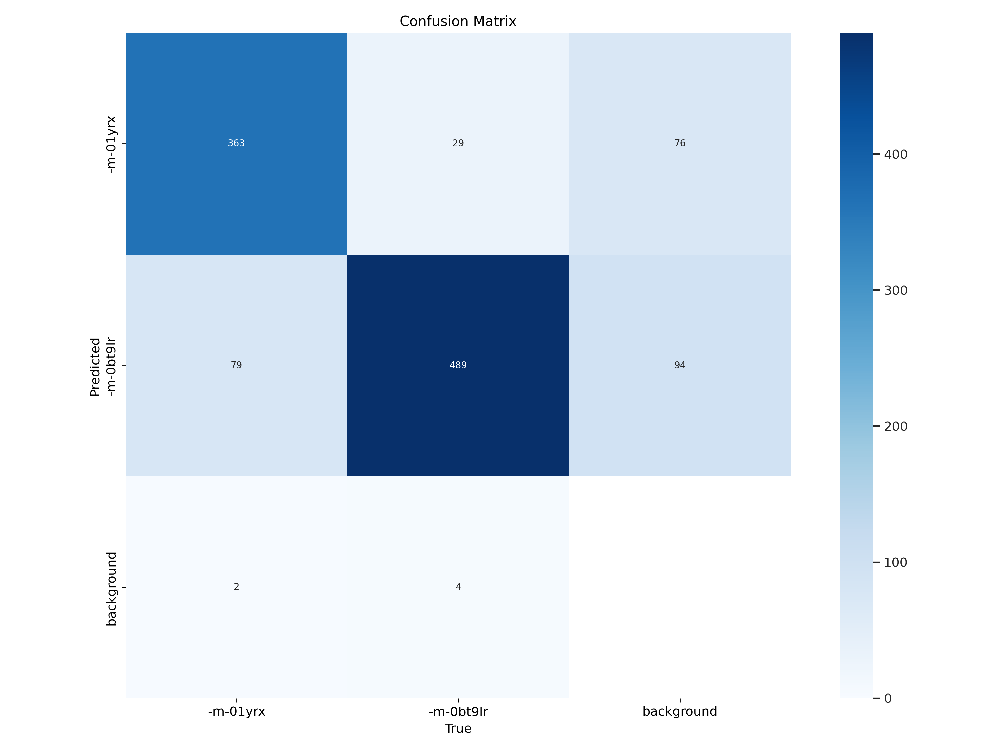

In [ ]:
Image(filename = "/content/runs/detect/val/confusion_matrix.png")

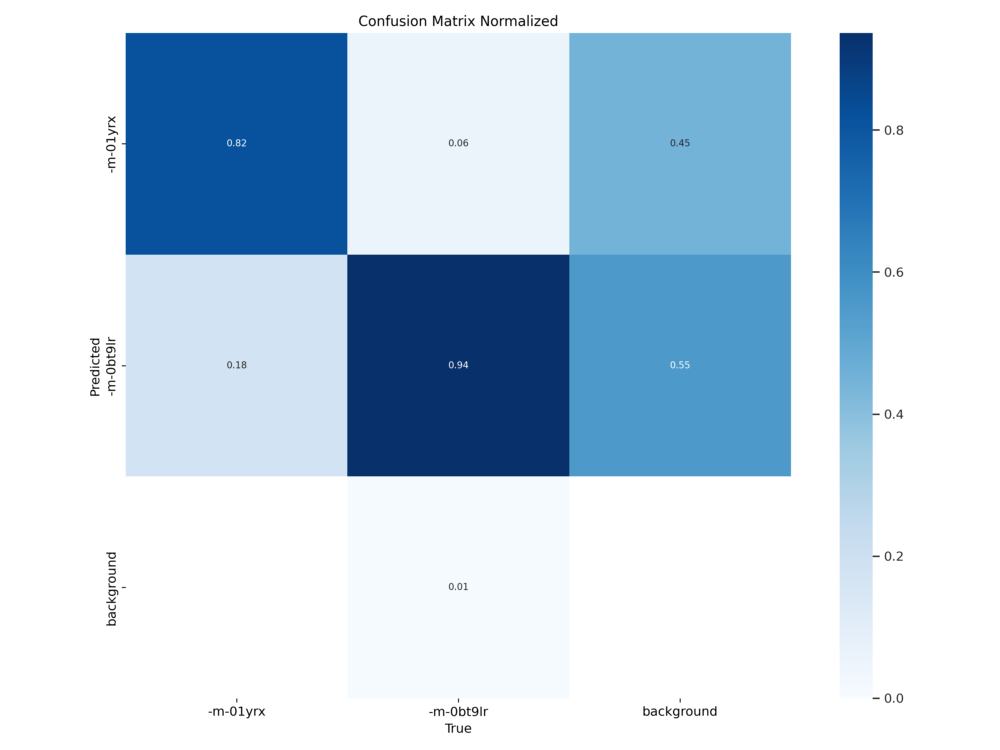

In [ ]:
Image(filename = "/content/runs/detect/val/confusion_matrix_normalized.png")

## Fully Convolutional Neural Network

Owen's section

### Imports, load Data

In [ ]:
# imports
from collections import Counter
import glob
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
from PIL import Image
from sklearn.exceptions import ConvergenceWarning
from sklearn.metrics import accuracy_score, mean_squared_error, roc_auc_score
from sklearn.model_selection import train_test_split
from tqdm.notebook import tqdm
import warnings

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# May need to change 'MyDrive' to 'Sharedwithme' - something along those lines, unless you copy the folder for yourself.
X = np.load('drive/MyDrive/cadod_data/data/img.npy', allow_pickle=True)
y_label = np.load('drive/MyDrive/cadod_data/data/y_label.npy', allow_pickle=True)
y_bbox = np.load('drive/MyDrive/cadod_data/data/y_bbox.npy', allow_pickle=True)

In [ ]:
# Important! Data needs reshaped before entering model.
X = X.reshape((12966, 128, 128, 3)) # Group by image, color, then 128x128 pixels.

### Model framework

#### Dataloader

In [ ]:
from keras.utils import to_categorical
from PIL import Image
class CaDoD_Dataloader():
    """
    Data generator for the CaDoD.
    """
    def __init__(self, data, labels, bboxes):
        self.data = data
        self.labels = labels
        self.bboxes = bboxes

    def generate_split_indexes(self):
        p = np.random.default_rng(seed=42).permutation(len(self.data))
        test_up_to = int(len(self.data)*1)     # This and line below grab 10% of data for use as test
        valid_up_to = int(len(self.data) * 0.9)
        train_idx = p[:valid_up_to]
        test_idx = p[valid_up_to:test_up_to]
        train_up_to = int(valid_up_to * 0.111)
        train_idx, valid_idx = train_idx[:train_up_to], train_idx[train_up_to:valid_up_to] # Set ~50% for training, ~10% for validation.

        return train_idx, valid_idx, test_idx

    def generate_images(self, image_idx, is_training, batch_size=16):
        """
        Used to generate a batch with images when training/testing/validating our Keras model.
        """

        # arrays to store our batched data
        images, labels, bboxes = [], [], []
        while True:
            for idx in np.random.default_rng(seed=42).permutation(image_idx):

                bbox = self.bboxes[idx]
                label = self.labels[idx]
                im = self.data[idx]

                labels.append(label)
                bboxes.append(bbox)
                images.append(im)

                # yielding condition
                if len(images) >= batch_size:
                    yield np.array(images), [np.array(labels), np.array(bboxes)]
                    images, labels, bboxes = [], [], []

            if not is_training:
                break

data_generator = CaDoD_Dataloader(X, y_label, y_bbox)
train_idx, valid_idx, test_idx = data_generator.generate_split_indexes()

#### Model

In [ ]:
from keras.models import Model
from keras.layers import BatchNormalization
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Activation
from keras.layers import Dropout
from keras.layers import Lambda
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import Input
import tensorflow as tf
"""
Todo: define defaults
"""
class FCN_CaDoD_Model():
    def __init__(self,
                 hidden_layers = [[32, 3, 1, 0.2]], # Can add more list items to add hidden layers
                 cls_layers = [[16, 0.2]], # similar to above
                 cls_activation = "softmax", # 'sigmoid', etc
                 greyscale = False,
                 bbox_layers = [], # Default to empty
                 bbox_activation = "linear"
                 ):
      self.hidden_layers = hidden_layers
      self.cls_layers = cls_layers
      self.cls_activation = cls_activation
      self.greyscale = greyscale
      self.bbox_layers = bbox_layers
      self.bbox_activation = bbox_activation


    # Define hidden layers using given parameters.
    def make_default_hidden_layers(self, inputs, hidden_layers):

        x = inputs
        for i in hidden_layers:
          x = tf.keras.layers.Conv2D(filters=i[0], kernel_size=i[1], strides=i[2])(x)
          x = tf.keras.layers.Dropout(i[3])(x)
          x = tf.keras.layers.BatchNormalization()(x)
          x = tf.keras.layers.Activation('relu')(x)

        return x


    # Define classification layers for class prediction:
    # Builds hidden layers and classification layers.
    # num_classes doesn't change for our task, but we can modify for other modelling tasks.
    def build_classification_branch(self, inputs, hidden_layers, cls_layers, cls_activation, greyscale, num_classes=1):

        if greyscale == True:
          x = Lambda(lambda c: tf.image.rgb_to_grayscale(c))(inputs) # Convert images to greyscale.
        else:
          x = inputs  # If we don't want to change images to greyscale.

        x = self.make_default_hidden_layers(inputs, hidden_layers) # make hidden layers first

        x = Flatten()(x) # Make resultant images a vector for dense layers

        for i in cls_layers: # Looping allows for more fine-tuning of classification specifically:
          x = tf.keras.layers.Dropout(i[1])(x)
          x = tf.keras.layers.BatchNormalization()(x)
          x = tf.keras.layers.Dense(i[0])(x)
          x = tf.keras.layers.Activation('relu')(x)

        # Final layer

        x = tf.keras.layers.Dropout(cls_layers[0][1])(x) # Set fixed drop rate dependent on first clasification layer.
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Dense(units=num_classes)(x)
        x = tf.keras.layers.Activation(cls_activation, name="class_pred")(x)
        return x


    # Define regression layers for bounding box prediction:
    # Builds hidden layers and regression layers.
    def build_bbox_branch(self, inputs, hidden_layers, bbox_layers, bbox_activation):

        # Don't include greyscale layer - we want all the information we can get.

        x = self.make_default_hidden_layers(inputs, hidden_layers) # Make hidden layers first

        if bbox_layers != []:
          for i in bbox_layers: # Additional layers for regression
            x = tf.keras.layers.Conv2D(filters=i[0], kernel_size=i[1], strides=i[2])(x)
            x = tf.keras.layers.Dropout(i[3])(x)
            x = tf.keras.layers.BatchNormalization()(x)
            x = tf.keras.layers.Activation('relu')(x)

        # Finally, make final layers for bounding box prediction
        x = Flatten()(x)
        x = Dense(128)(x)
        x = Activation("relu")(x)
        x = BatchNormalization()(x)
        x = Dropout(hidden_layers[0][3])(x)
        x = Dense(4)(x) # 4 output layers in our regression
        x = Activation(bbox_activation, name="bbox_pred")(x)
        return x


    def assemble_full_model(self, width, height):
        """
        Used to assemble our multi-output model CNN.
        """
        input_shape = (128, 128, 3)
        inputs = Input(shape=input_shape)
        classification_branch = self.build_classification_branch(inputs, self.hidden_layers, self.cls_layers, self.cls_activation, self.greyscale, num_classes=1)
        bbox_branch = self.build_bbox_branch(inputs, self.hidden_layers, self.bbox_layers, self.bbox_activation)
        model = Model(inputs=inputs,
                     outputs = [classification_branch, bbox_branch],
                     name="fcn_cadod")
        return model

model = FCN_CaDoD_Model().assemble_full_model(128, 128)

#### Train 1st model

In [ ]:
%%time

from keras.optimizers import Adam
init_lr = 1e-4
epochs = 20
opt = Adam(learning_rate=init_lr, weight_decay=init_lr/epochs)
model.compile(optimizer=opt,
              loss={
                  "class_pred": tf.keras.losses.BinaryCrossentropy(from_logits=True),
                  "bbox_pred": tf.keras.losses.MeanSquaredError(reduction="sum_over_batch_size", name="mean_squared_error")},
              metrics={
                  'class_pred': tf.keras.metrics.Accuracy(),
                  'bbox_pred': tf.keras.metrics.MeanSquaredError()})

CPU times: user 21.7 ms, sys: 197 µs, total: 21.9 ms
Wall time: 20.9 ms


In [ ]:
%%time

from keras.callbacks import ModelCheckpoint
batch_size = 32
valid_batch_size = 32
train_gen = data_generator.generate_images(train_idx, is_training=True, batch_size=batch_size)
valid_gen = data_generator.generate_images(valid_idx, is_training=True, batch_size=valid_batch_size)
callbacks = [
    ModelCheckpoint("./model_checkpoint", monitor='val_loss')
]
history = model.fit(train_gen,
                    steps_per_epoch=len(train_idx)//batch_size,
                    epochs=epochs,
                    callbacks=callbacks,
                    validation_data=valid_gen,
                    validation_steps=len(valid_idx)//valid_batch_size)

Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:5820: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


30/30 [==============================] - 19s 216ms/step - loss: 2.2659 - class_pred_loss: 0.9414 - bbox_pred_loss: 1.3245 - class_pred_accuracy: 0.5292 - bbox_pred_mean_squared_error: 1.3245 - val_loss: 164.3124 - val_class_pred_loss: 1.2707 - val_bbox_pred_loss: 163.0417 - val_class_pred_accuracy: 0.5295 - val_bbox_pred_mean_squared_error: 163.0417
Epoch 2/20
30/30 [==============================] - 6s 213ms/step - loss: 1.4654 - class_pred_loss: 0.6552 - bbox_pred_loss: 0.8102 - class_pred_accuracy: 0.5323 - bbox_pred_mean_squared_error: 0.8102 - val_loss: 28.5052 - val_class_pred_loss: 0.8851 - val_bbox_pred_loss: 27.6201 - val_class_pred_accuracy: 0.5298 - val_bbox_pred_mean_squared_error: 27.6201
Epoch 3/20
30/30 [==============================] - 6s 209ms/step - loss: 1.2933 - class_pred_loss: 0.5745 - bbox_pred_loss: 0.7188 - class_pred_accuracy: 0.5323 - bbox_pred_mean_squared_error: 0.7188 - val_loss: 6.8467 - val_class_pred_loss: 0.7592 - val_bbox_pred_loss: 6.0874 - val_clas

### Tryout other parameters, using Tensorboard:

In [ ]:
%load_ext tensorboard

In [ ]:
%%time

import tensorflow as tf
import datetime

# Clear any logs from previous runs
!rm -rf ./logs/

# Try a new model first
model2 = FCN_CaDoD_Model(hidden_layers = [[32, 3, 1, 0.2], [64, 3, 1, 0.2], [128, 3, 2, 0.2]]).assemble_full_model(128, 128)

from keras.optimizers import Adam
# init_lr = 1e-4
epochs = 20
# opt = Adam(learning_rate=init_lr, weight_decay=init_lr/epochs)
# Try new optimizer:
opt = tf.keras.optimizers.RMSprop(learning_rate=1e-3)
model2.compile(optimizer=opt,
              loss={
                  "class_pred": tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction='sum_over_batch_size'),
                  "bbox_pred": tf.keras.losses.MeanSquaredError(reduction="sum_over_batch_size", name="mean_squared_error")},
              metrics={
                  'class_pred': tf.keras.metrics.Accuracy(),
                  'bbox_pred': tf.keras.metrics.MeanSquaredError()})

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

from keras.callbacks import ModelCheckpoint
batch_size = 32
valid_batch_size = 32
train_gen = data_generator.generate_images(train_idx, is_training=True, batch_size=batch_size)
valid_gen = data_generator.generate_images(valid_idx, is_training=True, batch_size=valid_batch_size)
callbacks = [
    ModelCheckpoint("./model2_checkpoint", monitor='val_loss')
]
history = model2.fit(train_gen,
                    steps_per_epoch=len(train_idx)//batch_size,
                    epochs=epochs,
                    callbacks=[tensorboard_callback],
                    validation_data=valid_gen,
                    validation_steps=len(valid_idx)//valid_batch_size)

Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:5820: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


40/40 [==============================] - 25s 322ms/step - loss: 1.6157 - class_pred_loss: 0.8840 - bbox_pred_loss: 0.7316 - class_pred_accuracy: 0.5258 - bbox_pred_mean_squared_error: 0.7316 - val_loss: 20.2332 - val_class_pred_loss: 15.7443 - val_bbox_pred_loss: 4.4889 - val_class_pred_accuracy: 0.5287 - val_bbox_pred_mean_squared_error: 4.4889
Epoch 2/20
40/40 [==============================] - 12s 300ms/step - loss: 1.0386 - class_pred_loss: 0.7486 - bbox_pred_loss: 0.2900 - class_pred_accuracy: 0.5289 - bbox_pred_mean_squared_error: 0.2900 - val_loss: 2.7235 - val_class_pred_loss: 2.3191 - val_bbox_pred_loss: 0.4044 - val_class_pred_accuracy: 0.5286 - val_bbox_pred_mean_squared_error: 0.4044
Epoch 3/20
40/40 [==============================] - 12s 299ms/step - loss: 0.8706 - class_pred_loss: 0.6333 - bbox_pred_loss: 0.2373 - class_pred_accuracy: 0.5297 - bbox_pred_mean_squared_error: 0.2373 - val_loss: 0.9613 - val_class_pred_loss: 0.8451 - val_bbox_pred_loss: 0.1162 - val_class_pre

In [ ]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

#### Consider results on Test data

In [ ]:
test_gen = data_generator.generate_images(test_idx, is_training=True, batch_size=32)
model2.evaluate(test_gen, steps=5)

5/5 [==============================] - 0s 17ms/step - loss: 1.0696 - class_pred_loss: 1.0488 - bbox_pred_loss: 0.0208 - class_pred_accuracy: 0.5312 - bbox_pred_mean_squared_error: 0.0208


[1.0695722103118896,
 1.0487861633300781,
 0.020786220207810402,
 0.53125,
 0.020786220207810402]

In [ ]:
test_gen = data_generator.generate_images(test_idx, is_training=True, batch_size=32)
test_preds = model2.predict(test_gen, steps=1)

1/1 [==============================] - 0s 33ms/step


### FCN Conclusion

This model only predicts dogs, but even without a proper gridsearch to do hyperparameter tuning does well for bounding box prediction looking strictly at MSE. Further testing and experimentation with the model framework is required.

Some potential fixed include - cutoff for logit (closer to class imbalance), aligning the loss and accuracy function more closely, or there may be an input data issue.

#### References specific to FCN:

###### I modeled my FCN on these two examples:

Bressan, Rodrigo. “Building a Multi-Output Convolutional Neural Network with Keras.” Medium, Towards Data Science, 2 June 2020, towardsdatascience.com/building-a-multi-output-convolutional-neural-network-with-keras-ed24c7bc1178.

GitHub, github.com/himanshurawlani/fully_convolutional_network/blob/master/generator.py. Accessed 5 Dec. 2023.

###### Additional documentation:

Team, Keras. “Simple. Flexible. Powerful.” Keras, keras.io/. Accessed 5 Dec. 2023.



# References

Mingxing Tan, Ruoming Pang, Quoc V. Le. EfficientDet: Scalable and Efficient Object Detection. CVPR 2020. Arxiv link: https://arxiv.org/abs/1911.09070

“Optical Recognition of Handwritten Digits.” UCI Machine Learning Repository, archive.ics.uci.edu/dataset/80/optical+recognition+of+handwritten+digits. Accessed 13 Nov. 2023.

https://github.com/google/automl/tree/master/efficientdet